In [1]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns

# Query Data Using SQL

In [2]:
import os

In [3]:
import sqlite3

In [4]:
con = sqlite3.connect('C:/Users/your-username/database.sqlite')

In [ ]:
pd.read_sql_query('SELECT * FROM Reviews', con) #using sql quering data

In [6]:
df = pd.read_sql_query('SELECT * FROM Reviews', con) #using sql quering data

In [7]:
df.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,Great taffy at a great price. There was a wid...


In [8]:
df.shape

(568454, 10)

# Basic Sentiment Analysis on Text Column Data 

In [9]:
#!pip install TextBlob

In [10]:
from textblob import TextBlob

In [11]:
text = df['Summary'][0]
text

'Good Quality Dog Food'

In [12]:
TextBlob(text).sentiment.polarity

0.7

In [13]:
polarity = []


for i in df['Summary']:
    try: 
        polarity.append(TextBlob(i).sentiment.polarity)
        
    except: 
        polarity.append(0) #handle missing value

In [14]:
len(polarity)

568454

In [15]:
data = df.copy()

In [16]:
data['Polarity'] = polarity

In [ ]:
data.head()

In [18]:
np.unique(data['Polarity'], return_counts=True)

(array([-1.        , -1.        , -0.9765625 , ...,  0.99182129,
         0.9921875 ,  1.        ]),
 array([ 5428,     1,    61, ...,     1,     1, 79876], dtype=int64))

In [19]:
np.unique(data['Polarity']).size

4578

In [20]:
data['Polarity'].unique().size

4578

In [21]:
data['Polarity'].nunique()

4578

In [22]:
data[data['Polarity'] > 0]['Polarity']

0         0.700000
4         0.800000
5         0.600000
6         0.358333
7         1.000000
            ...   
568447    0.100000
568448    0.278571
568451    1.000000
568452    0.500000
568453    0.800000
Name: Polarity, Length: 331665, dtype: float64

In [23]:
data[data['Polarity'] < 0]['Polarity']

16       -0.400
26       -1.000
57       -0.625
61       -0.125
62       -0.500
          ...  
568432   -0.350
568433   -1.000
568436   -0.250
568446   -0.250
568450   -0.750
Name: Polarity, Length: 52516, dtype: float64

In [24]:
data[data['Polarity'] == 0]['Polarity']

1         0.0
2         0.0
3         0.0
8         0.0
14        0.0
         ... 
568435    0.0
568438    0.0
568439    0.0
568445    0.0
568449    0.0
Name: Polarity, Length: 184273, dtype: float64

In [25]:
polarity_pie = (data[data['Polarity'] > 0]['Polarity'].count(), data[data['Polarity'] < 0]['Polarity'].count(), data[data['Polarity'] == 0]['Polarity'].count())
polarity_pie

(331665, 52516, 184273)

In [26]:
np.array(polarity_pie)

polarity_pie = pd.DataFrame(polarity_pie, index=['Positive','Negetive','Neutral'])
polarity_pie

,0
Positive,331665
Negetive,52516
Neutral,184273


In [27]:
polarity_pie.index

Index(['Positive', 'Negetive', 'Neutral'], dtype='object')

In [28]:
import plotly.express as px

In [29]:
figure = px.pie(values=polarity_pie[0], names=polarity_pie.index)
figure.show()

# Process Text Data and Creat Word Cloud on Positive Polarity Comments

In [30]:
data_positive = data[data['Polarity']>0]

In [31]:
data_positive.shape

(331665, 11)

In [32]:
#!pip install wordcloud

In [33]:
from wordcloud import WordCloud,STOPWORDS

In [34]:
stopwords = set(STOPWORDS)

In [ ]:
data_positive.head()

In [36]:
total_text = (' '.join(data_positive['Summary'])) #specific for str

In [37]:
data_positive['Summary'].dtype

dtype('O')

In [ ]:
total_text

In [39]:
len(total_text)

8465012

In [40]:
import re #regular expression

In [41]:
total_text = re.sub('[^a-zA-Z]', ' ', total_text) #only keep text words

In [ ]:
total_text

In [43]:
total_text = re.sub(' +', ' ', total_text) #only keep one space ' '

In [ ]:
total_text

(-0.5, 999.5, 499.5, -0.5)

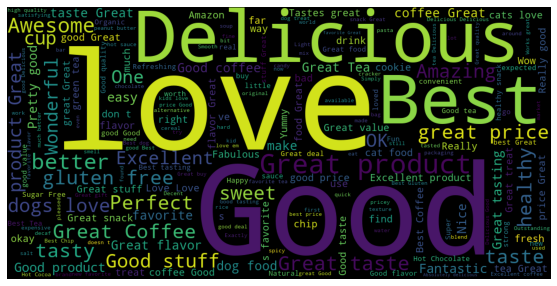

In [45]:
wordcloud = WordCloud(width = 1000, height = 500, stopwords = stopwords).generate(total_text)
plt.figure(figsize=(15,5))
plt.imshow(wordcloud)
plt.axis('off')

# Process Text Data and Creat Word Cloud on Negetive Polarity Comments  

In [46]:
data_negative = data[data['Polarity']<0]

In [47]:
total_text_negative = (' '.join(data_negative['Summary'])) 

In [48]:
total_text_negative = re.sub('[^a-zA-Z]', ' ', total_text_negative) #only keep text words

In [49]:
total_text_negative = re.sub(' +', ' ', total_text_negative) #only keep one space ' '

(-0.5, 999.5, 499.5, -0.5)

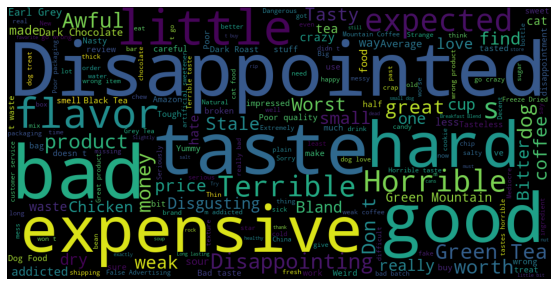

In [50]:
wordcloud_negative = WordCloud(width = 1000, height = 500, stopwords = stopwords).generate(total_text_negative)
plt.figure(figsize=(15,5))
plt.imshow(wordcloud_negative)
plt.axis('off')

# Explore Text Length

In [51]:
df.size

5684540

In [52]:
df.isnull().sum()

Id                        0
ProductId                 0
UserId                    0
ProfileName               0
HelpfulnessNumerator      0
HelpfulnessDenominator    0
Score                     0
Time                      0
Summary                   0
Text                      0
dtype: int64

In [53]:
df['Text'][0]

'I have bought several of the Vitality canned dog food products and have found them all to be of good quality. The product looks more like a stew than a processed meat and it smells better. My Labrador is finicky and she appreciates this product better than  most.'

In [54]:
len(df['Text'][0])

263

In [55]:
len(df['Text'][0].split(' '))

49

In [56]:
#in this example, we will go with len(df['Text'][0].split(' ')), as we will use words count to express the comment length

In [57]:
def calculate_length(x): 
    return len(x.split(' '))

In [ ]:
df['TextLength'] = df['Text'].apply(calculate_length)
df.head()

In [59]:
px.box(df, y='TextLength')

#most users will write 200 words or less for comments

# Frequent Shoppers

In [60]:
df.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,TextLength
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...,49
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...,31
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...,99
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...,43
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,Great taffy at a great price. There was a wid...,30


In [61]:
df['UserId'].unique()

array(['A3SGXH7AUHU8GW', 'A1D87F6ZCVE5NK', 'ABXLMWJIXXAIN', ...,
       'A28KG5XORO54AY', 'A121AA1GQV751Z', 'A3LGQPJCZVL9UC'], dtype=object)

In [62]:
df['UserId'].unique().size

256059

In [63]:
df['UserId'].nunique() #practiced a different way to get the number 

256059

In [64]:
df.groupby('UserId').agg({'Summary':'count'})

,Summary
UserId,
#oc-R103C0QSV1DF5E,1
#oc-R109MU5OBBZ59U,1
#oc-R10LFEMQEW6QGZ,1
#oc-R10LT57ZGIB140,1
#oc-R10UA029WVWIUI,1
...,...
AZZV9PDNMCOZW,3
AZZVNIMTTMJH6,1
AZZY649VYAHQS,1


In [ ]:
raw = df.groupby('UserId').agg({'Summary':'count','Text':'count','Score':'mean','ProductId':'count'}).sort_values(by='Text', ascending=False)
raw

In [66]:
raw.columns = ['number_of_summaries', 'num_text', 'avg_score', 'no_of_product_purchased']
raw

,number_of_summaries,num_text,avg_score,no_of_product_purchased
UserId,,,,
A3OXHLG6DIBRW8,448,448,4.535714,448
A1YUL9PCJR3JTY,421,421,4.494062,421
AY12DBB0U420B,389,389,4.647815,389
A281NPSIMI1C2R,365,365,4.841096,365
A1Z54EM24Y40LL,256,256,4.453125,256
...,...,...,...,...
A2HROKQO0GA5AF,1,1,3.000000,1
A2HROR28DMJV2W,1,1,5.000000,1
A2HRR8CO2Y20G8,1,1,5.000000,1


In [67]:
user_top_10 = raw.index[0:10]

In [68]:
number_top_10 = raw['no_of_product_purchased'][0:10]

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9], <a list of 10 Text major ticklabel objects>)

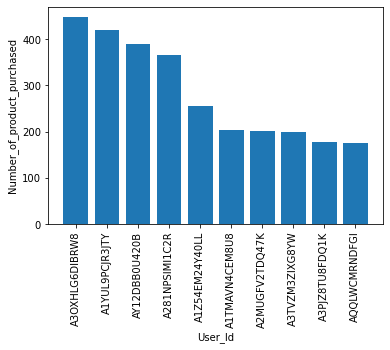

In [69]:
#top 10 shoppers by product purchased

plt.bar(user_top_10, number_top_10, label='most recommended users')
plt.xlabel('User_Id')
plt.ylabel('Number_of_product_purchased')
plt.xticks(rotation='vertical')